##Data Visulization
##Lab 4

In [11]:
#Imporing Libraries
import pandas as pd
from google.colab import drive
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [12]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [13]:
# Load datasets
customer_df = pd.read_csv('/content/drive/MyDrive/Data Visualization /Lab4/olist_customers_dataset.csv')
order_item_df = pd.read_csv('/content/drive/MyDrive/Data Visualization /Lab4/olist_order_items_dataset.csv')
order_df = pd.read_csv('/content/drive/MyDrive/Data Visualization /Lab4/olist_orders_dataset.csv')
product_df = pd.read_csv('/content/drive/MyDrive/Data Visualization /Lab4/olist_products_dataset.csv')
seller_df = pd.read_csv('/content/drive/MyDrive/Data Visualization /Lab4/olist_sellers_dataset.csv')

In [14]:
# Merge necessary datasets
merged_df = pd.merge(order_item_df, product_df, on='product_id', how='inner')
merged_df = pd.merge(merged_df, order_df, on='order_id', how='inner')
merged_df = pd.merge(merged_df, customer_df, on='customer_id', how='inner')

In [15]:
merged_df.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_category_name,product_name_lenght,product_description_lenght,...,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.9,13.29,cool_stuff,58.0,598.0,...,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29 00:00:00,871766c5855e863f6eccc05f988b23cb,28013,campos dos goytacazes,RJ
1,130898c0987d1801452a8ed92a670612,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-07-05 02:44:11,55.9,17.96,cool_stuff,58.0,598.0,...,delivered,2017-06-28 11:52:20,2017-06-29 02:44:11,2017-07-05 12:00:33,2017-07-13 20:39:29,2017-07-26 00:00:00,0fb8e3eab2d3e79d92bb3fffbb97f188,75800,jatai,GO
2,532ed5e14e24ae1f0d735b91524b98b9,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2018-05-23 10:56:25,64.9,18.33,cool_stuff,58.0,598.0,...,delivered,2018-05-18 10:25:53,2018-05-18 12:31:43,2018-05-23 14:05:00,2018-06-04 18:34:26,2018-06-07 00:00:00,3419052c8c6b45daf79c1e426f9e9bcb,30720,belo horizonte,MG
3,6f8c31653edb8c83e1a739408b5ff750,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-08-07 18:55:08,58.9,16.17,cool_stuff,58.0,598.0,...,delivered,2017-08-01 18:38:42,2017-08-01 18:55:08,2017-08-02 19:07:36,2017-08-09 21:26:33,2017-08-25 00:00:00,e7c828d22c0682c1565252deefbe334d,83070,sao jose dos pinhais,PR
4,7d19f4ef4d04461989632411b7e588b9,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-08-16 22:05:11,58.9,13.29,cool_stuff,58.0,598.0,...,delivered,2017-08-10 21:48:40,2017-08-10 22:05:11,2017-08-11 19:43:07,2017-08-24 20:04:21,2017-09-01 00:00:00,0bb98ba72dcc08e95f9d8cc434e9a2cc,36400,conselheiro lafaiete,MG



#Monthly Changes in different product sold

In [16]:
# Calculate monthly sales
product_counts = merged_df['product_category_name'].value_counts()
popular_products = product_counts[product_counts > 50].index.tolist()

monthly_sales = merged_df.groupby([pd.to_datetime(merged_df['order_purchase_timestamp']).dt.to_period('M'),
                                   'product_category_name'])['order_id'].count().unstack().fillna(0)
monthly_sales = monthly_sales[popular_products]

In [17]:
# Define context settings
contexts = ["notebook", "talk", "poster"]
sizes = [(10, 6), (12, 8), (16, 12)]

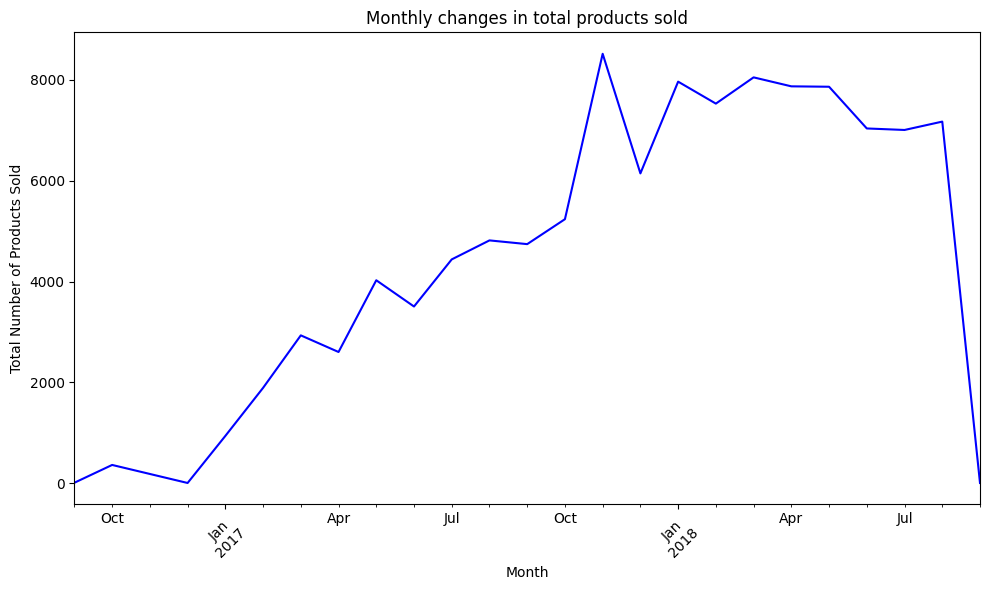

In [18]:
# Summing the products to get the total
total_sales = monthly_sales.sum(axis=1)

# Plot the total sales
plt.figure(figsize=(10, 6))
total_sales.plot(kind='line', color='blue')
plt.title('Monthly changes in total products sold')
plt.xlabel('Month')
plt.ylabel('Total Number of Products Sold')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


#Plotting Horizontally side by side as subplot, But a little confusing

<ipython-input-19-e5b3e3812f02>:16: UserWarning:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.



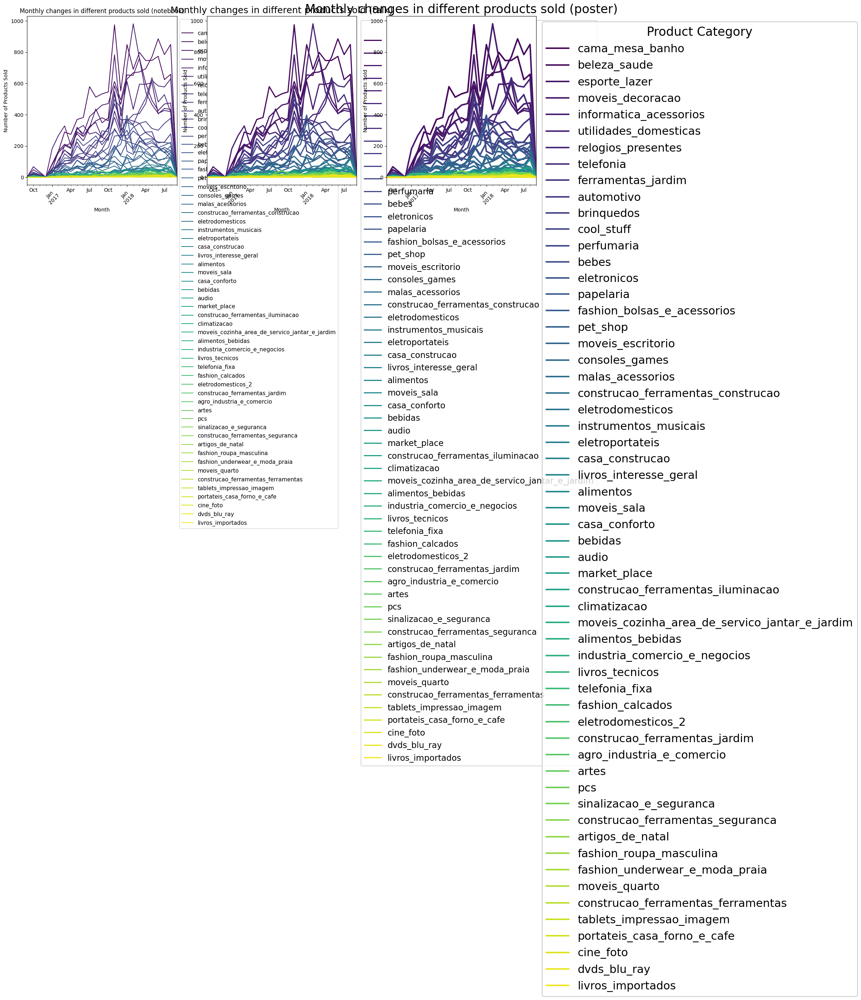

In [19]:
# Define color palette
continuous_palette = sns.color_palette("viridis", len(popular_products))

# Plot for different contexts
fig, axes = plt.subplots(1, len(contexts), figsize=(18, 6))

for i, (context, size) in enumerate(zip(contexts, sizes)):
    sns.set_context(context)
    monthly_sales.plot(kind='line', color=continuous_palette, ax=axes[i])
    axes[i].set_title(f'Monthly changes in different products sold ({context})')
    axes[i].set_xlabel('Month')
    axes[i].set_ylabel('Number of Products Sold')
    axes[i].legend(title='Product Category', bbox_to_anchor=(1, 1), loc='upper left')
    axes[i].tick_params(axis='x', rotation=45)

fig.tight_layout()
plt.show()


#Plotted these three representation side by side but in **vertical manner**, as in the horizontal manner the difference in representation type(Screen Display, Presentation and Poster) is not able to detect.

#Plotting vertically one after other (all the three representations)

##Continuous Color Palette

<ipython-input-20-b33ecc115da6>:14: UserWarning:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.

<ipython-input-20-b33ecc115da6>:14: UserWarning:

Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.

<ipython-input-20-b33ecc115da6>:14: UserWarning:

Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.



<Figure size 1000x600 with 0 Axes>

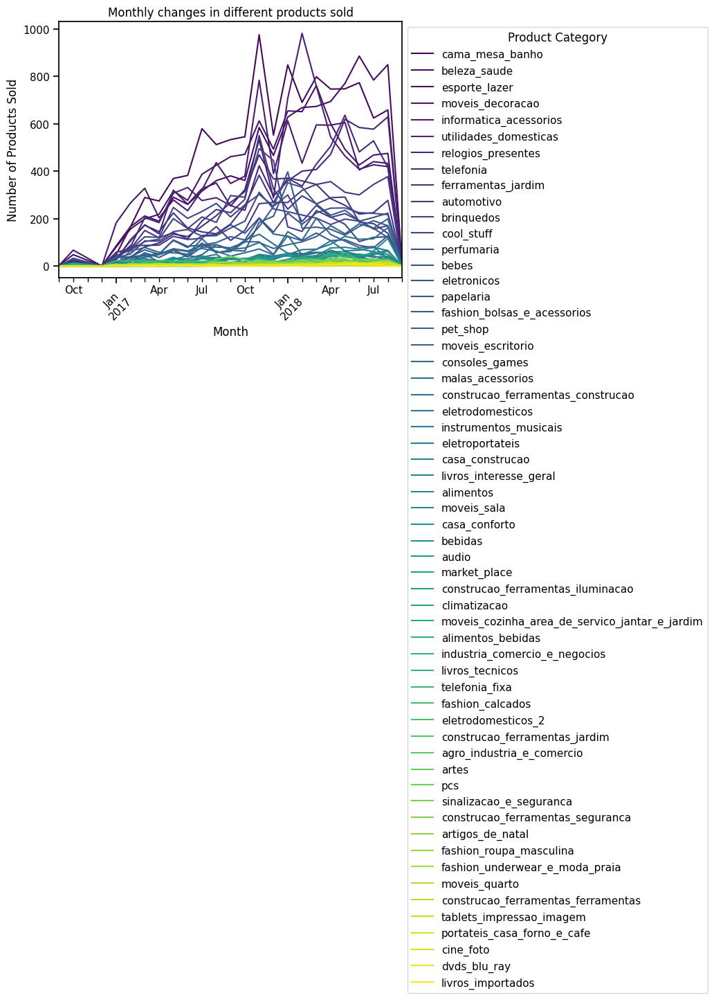

<Figure size 1200x800 with 0 Axes>

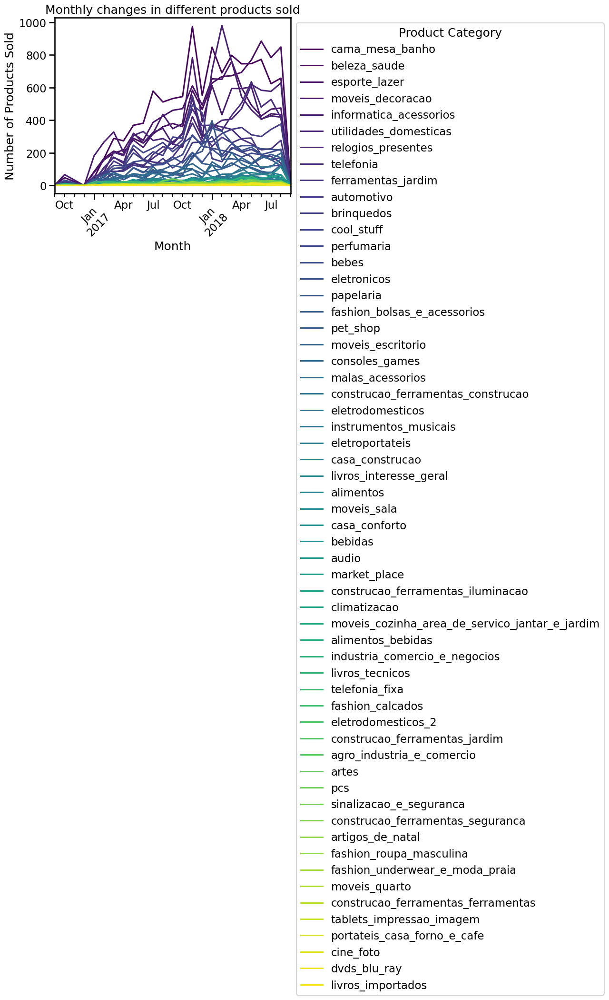

<Figure size 1600x1200 with 0 Axes>

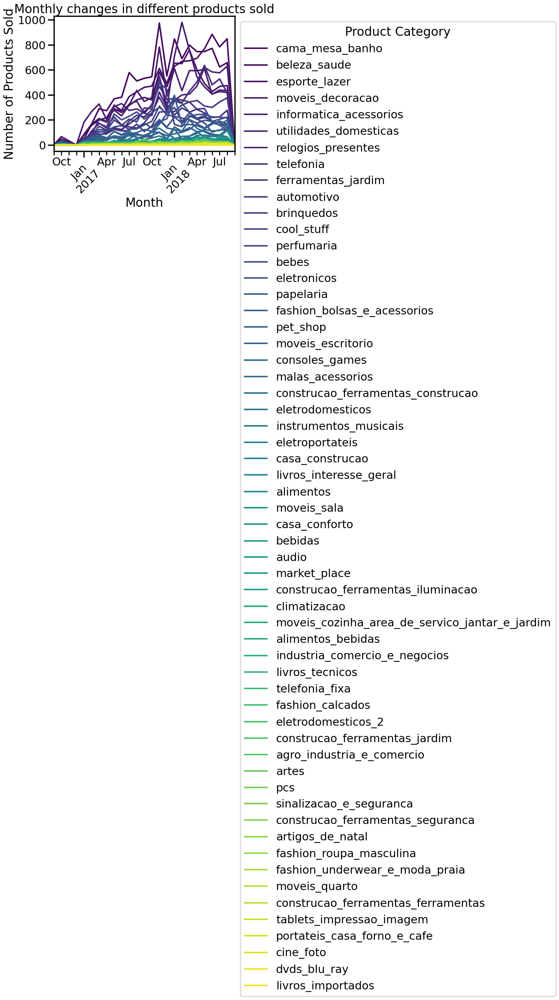

In [20]:
# Define color palette
continuous_palette = sns.color_palette("viridis", len(popular_products))

# Plot for different contexts
for context, size in zip(contexts, sizes):
    sns.set_context(context)
    plt.figure(figsize=size)
    monthly_sales.plot(kind='line', color=continuous_palette)
    plt.title('Monthly changes in different products sold')
    plt.xlabel('Month')
    plt.ylabel('Number of Products Sold')
    plt.xticks(rotation=45)
    plt.legend(title='Product Category', bbox_to_anchor=(1, 1), loc='upper left')
    plt.tight_layout()

plt.show()


##One Color Sequential Scale

<ipython-input-21-24b800ad5290>:14: UserWarning:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.

<ipython-input-21-24b800ad5290>:14: UserWarning:

Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.

<ipython-input-21-24b800ad5290>:14: UserWarning:

Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.



<Figure size 1000x600 with 0 Axes>

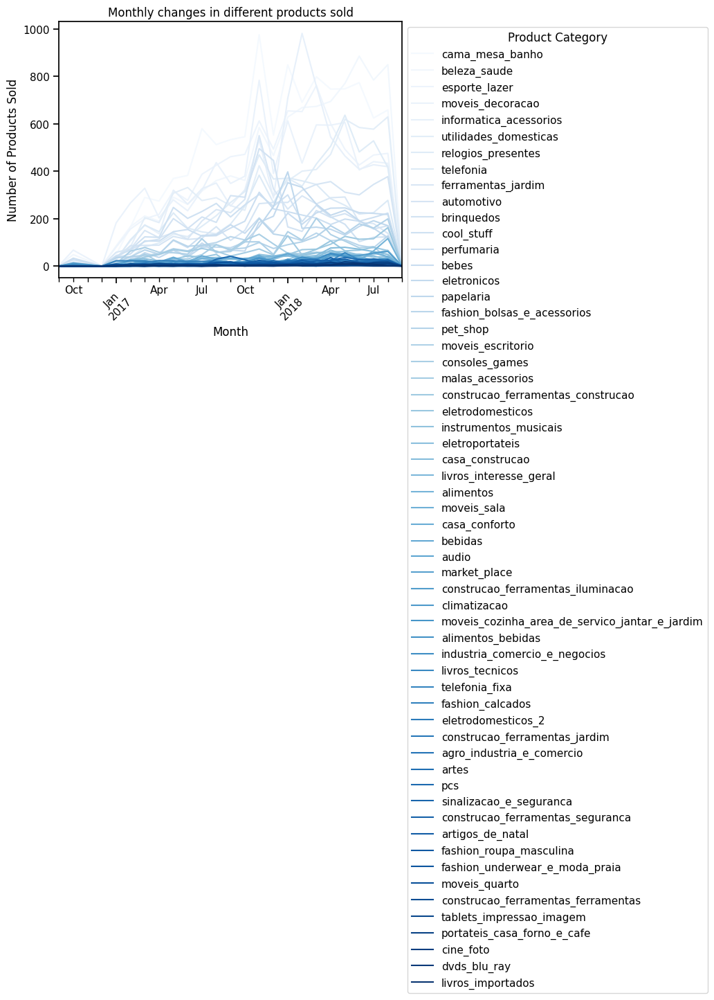

<Figure size 1200x800 with 0 Axes>

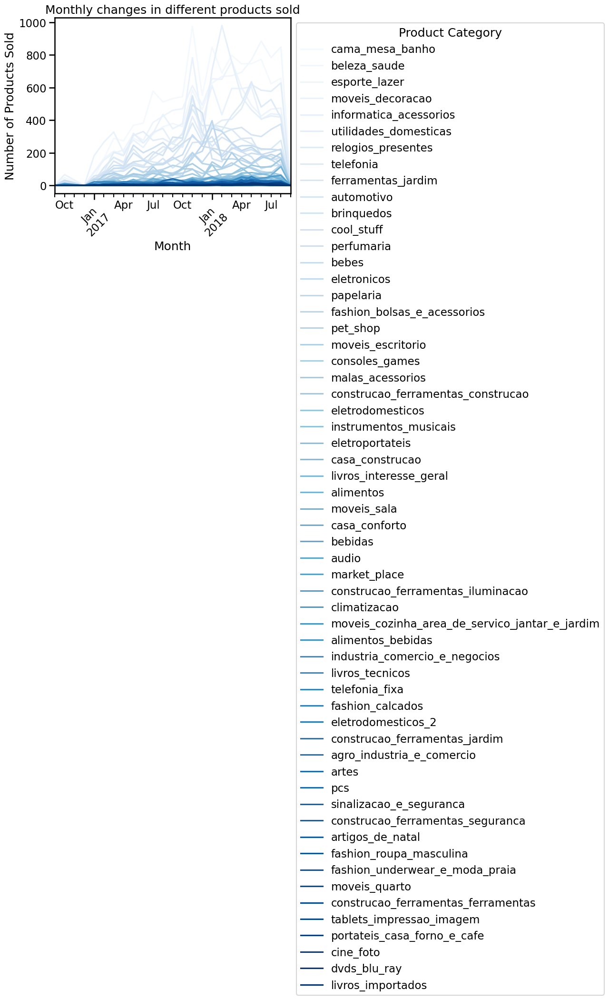

<Figure size 1600x1200 with 0 Axes>

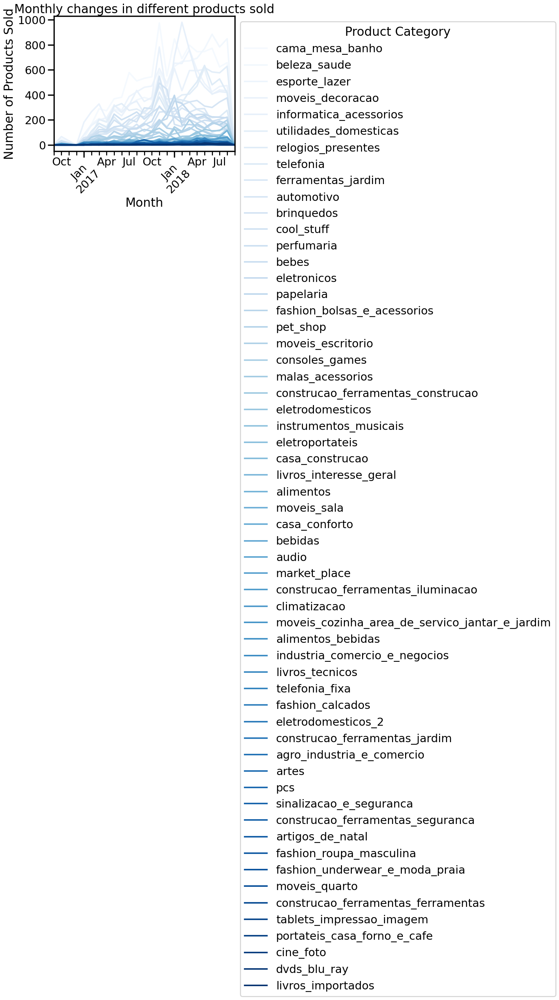

In [21]:
# Define color palette
sequential_palette = sns.color_palette("Blues", len(popular_products))

# Plot for different contexts
for context, size in zip(contexts, sizes):
    sns.set_context(context)
    plt.figure(figsize=size)
    monthly_sales.plot(kind='line', color=sequential_palette)
    plt.title('Monthly changes in different products sold')
    plt.xlabel('Month')
    plt.ylabel('Number of Products Sold')
    plt.xticks(rotation=45)
    plt.legend(title='Product Category', bbox_to_anchor=(1, 1), loc='upper left')
    plt.tight_layout()

plt.show()


##Bipolar Sequential

<ipython-input-22-f1f4b0883919>:14: UserWarning:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.

<ipython-input-22-f1f4b0883919>:14: UserWarning:

Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.

<ipython-input-22-f1f4b0883919>:14: UserWarning:

Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.



<Figure size 1000x600 with 0 Axes>

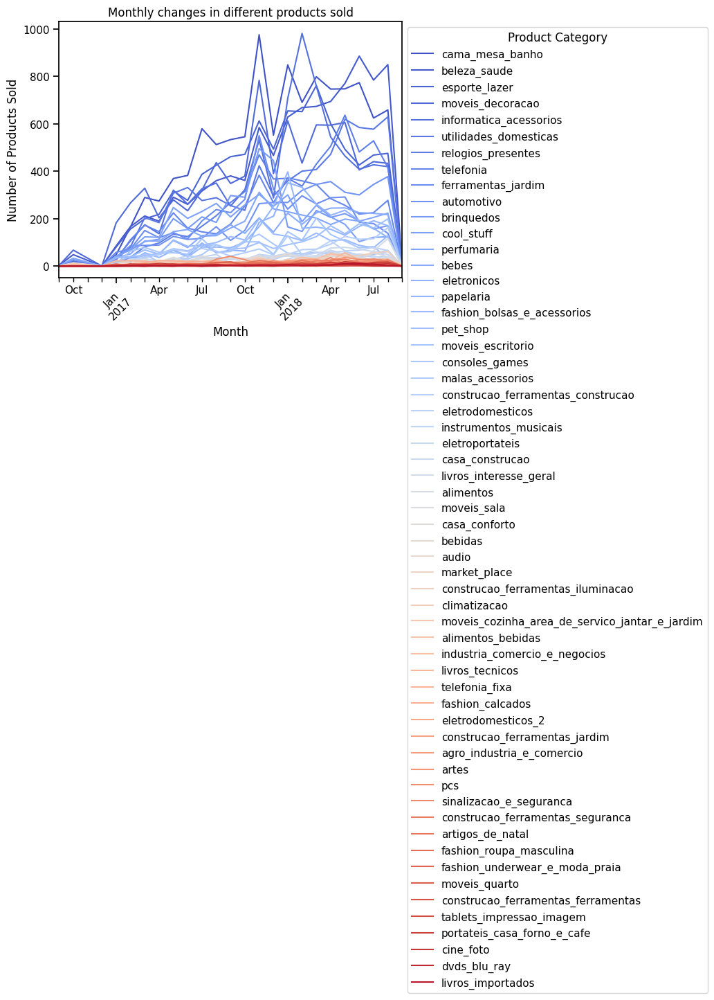

<Figure size 1200x800 with 0 Axes>

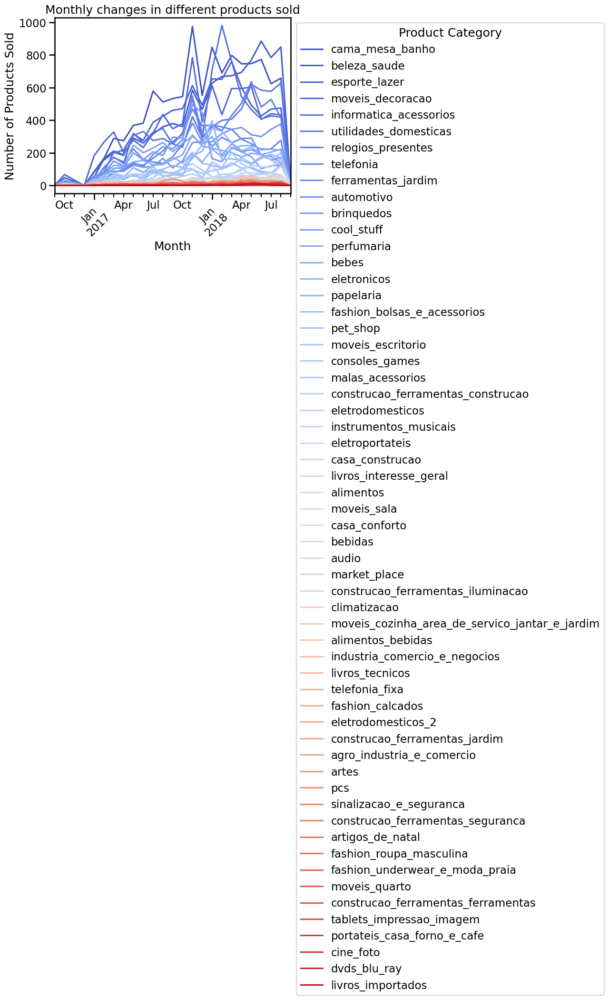

<Figure size 1600x1200 with 0 Axes>

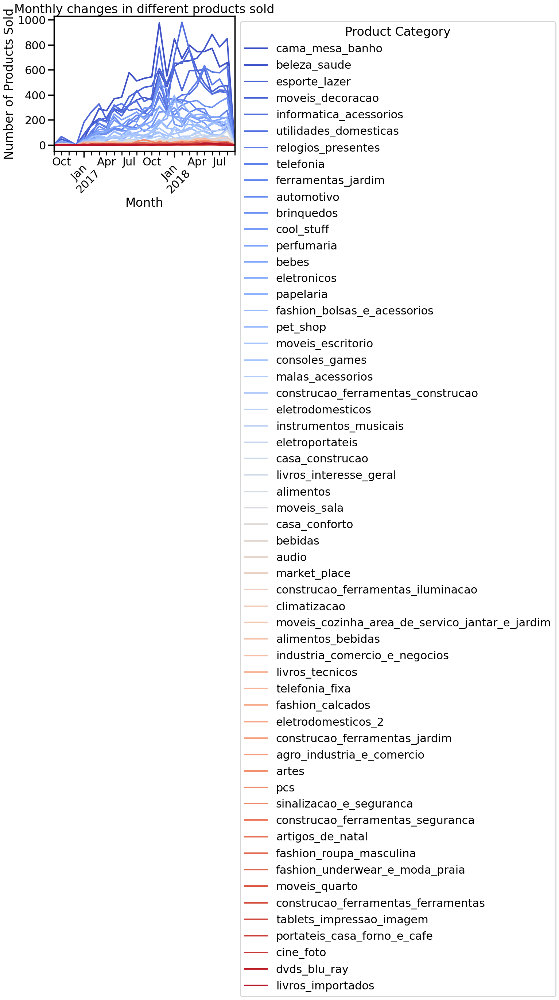

In [22]:
# Define color palette
bipolar_palette = sns.color_palette("coolwarm", len(popular_products))

# Plot for different contexts
for context, size in zip(contexts, sizes):
    sns.set_context(context)
    plt.figure(figsize=size)
    monthly_sales.plot(kind='line', color=bipolar_palette)
    plt.title('Monthly changes in different products sold')
    plt.xlabel('Month')
    plt.ylabel('Number of Products Sold')
    plt.xticks(rotation=45)
    plt.legend(title='Product Category', bbox_to_anchor=(1, 1), loc='upper left')
    plt.tight_layout()

plt.show()


##Custom Colour

<ipython-input-23-6f81310c42d9>:14: UserWarning:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.

<ipython-input-23-6f81310c42d9>:14: UserWarning:

Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.

<ipython-input-23-6f81310c42d9>:14: UserWarning:

Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.



<Figure size 1000x600 with 0 Axes>

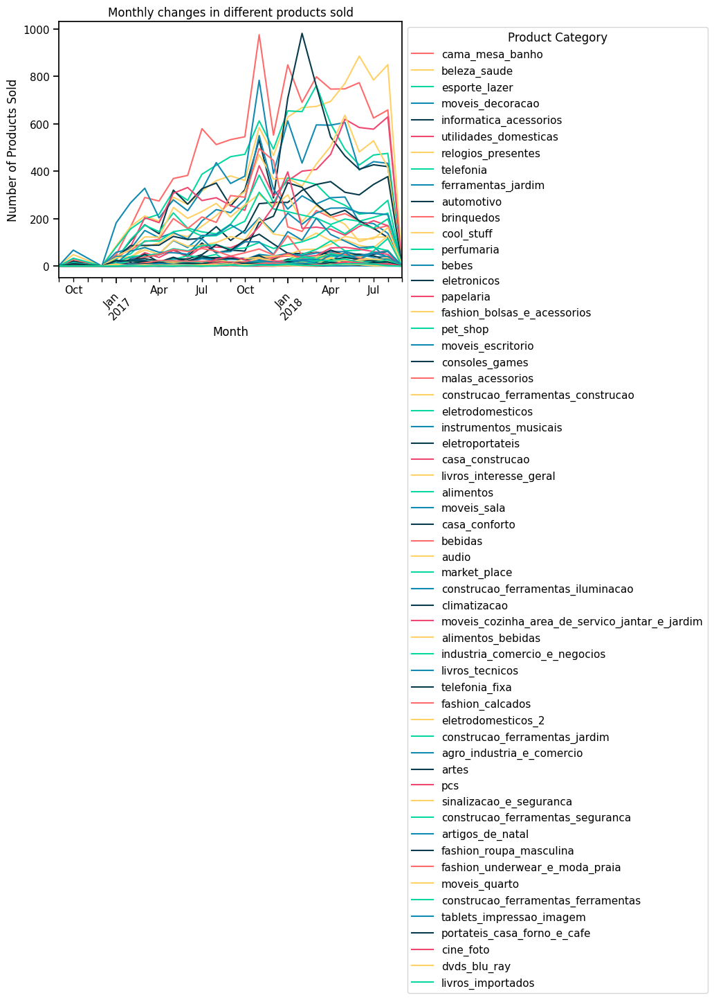

<Figure size 1200x800 with 0 Axes>

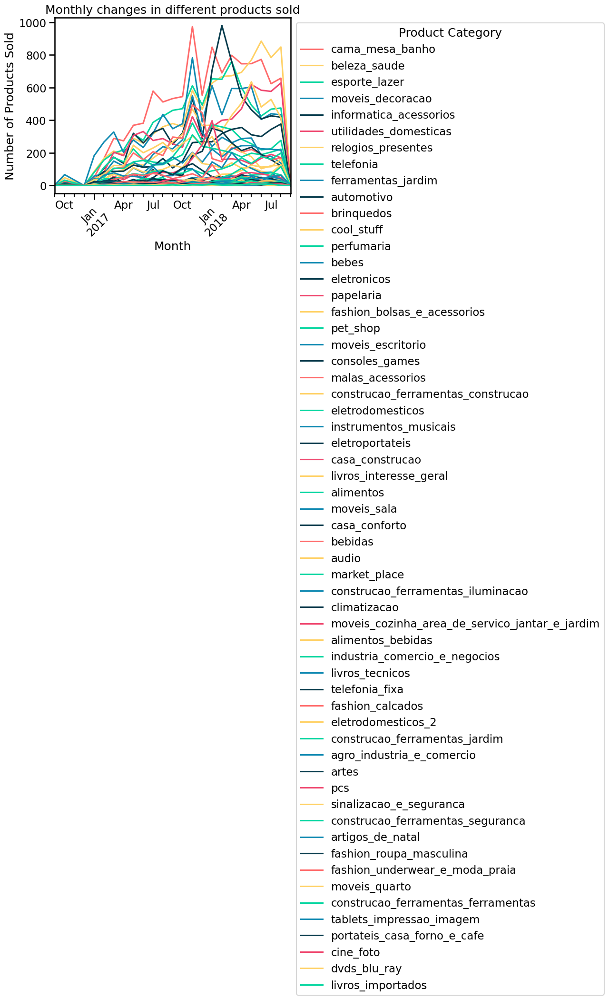

<Figure size 1600x1200 with 0 Axes>

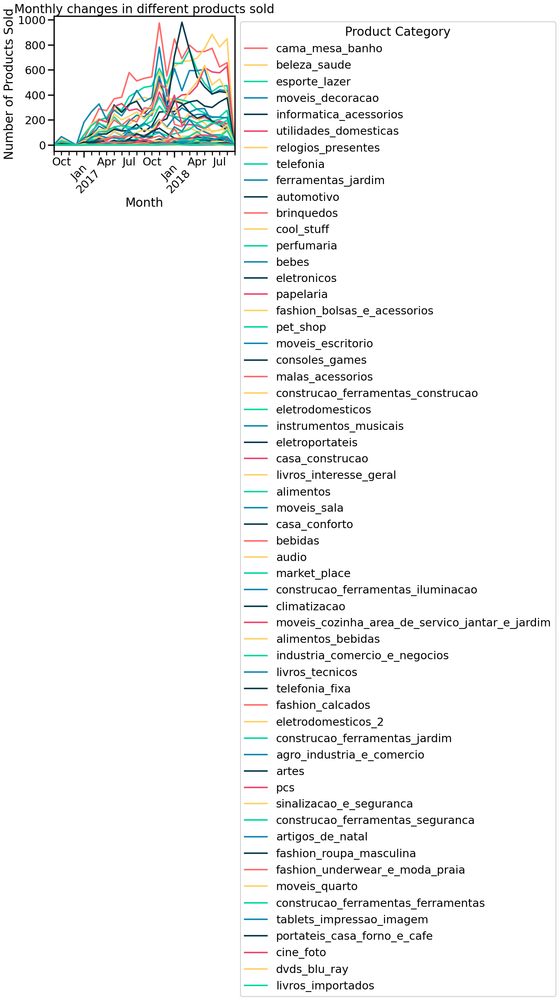

In [23]:
# Define color palette
custom_palette = ['#FF6B6B', '#FFD166', '#06D6A0', '#118AB2', '#073B4C', '#EF476F', '#FFD166', '#06D6A0', '#118AB2', '#073B4C']

# Plot for different contexts
for context, size in zip(contexts, sizes):
    sns.set_context(context)
    plt.figure(figsize=size)
    monthly_sales.plot(kind='line', color=custom_palette)
    plt.title('Monthly changes in different products sold')
    plt.xlabel('Month')
    plt.ylabel('Number of Products Sold')
    plt.xticks(rotation=45)
    plt.legend(title='Product Category', bbox_to_anchor=(1, 1), loc='upper left')
    plt.tight_layout()

plt.show()


#State wise distribution of total revenue

In [24]:
# Calculate state-wise total revenue
state_revenue = merged_df.groupby('customer_state')['price'].sum().sort_values()

#Plotting Horizontally side by side as subplot, But a little confusing

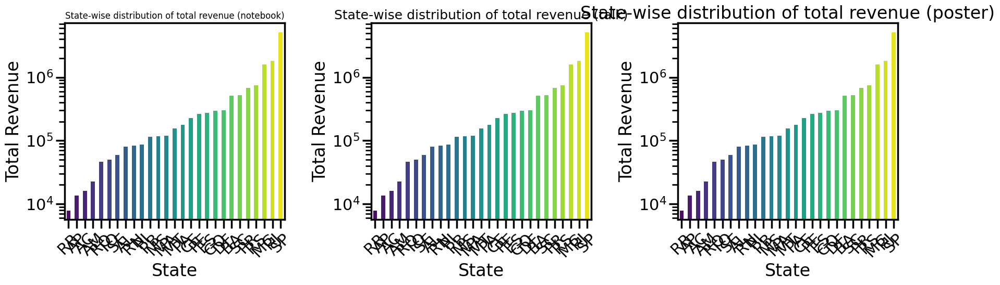

In [25]:
# Define color palette
continuous_palette = sns.color_palette("viridis", len(state_revenue))

# Plot for different contexts
fig, axes = plt.subplots(1, len(contexts), figsize=(18, 6))

for i, (context, size) in enumerate(zip(contexts, sizes)):
    sns.set_context(context)
    state_revenue.plot(kind='bar', color=continuous_palette, ax=axes[i])
    axes[i].set_title(f'State-wise distribution of total revenue ({context})')
    axes[i].set_xlabel('State')
    axes[i].set_ylabel('Total Revenue')
    axes[i].set_xticklabels(state_revenue.index, rotation=45)
    axes[i].set_yscale('log')

fig.tight_layout()
plt.show()


#Plotting vertically one after other (all the three representations)

##Continuous Scale



In [26]:
# Define context settings
contexts = ["notebook", "talk", "poster"]
sizes = [(10, 6), (12, 8), (16, 12)]

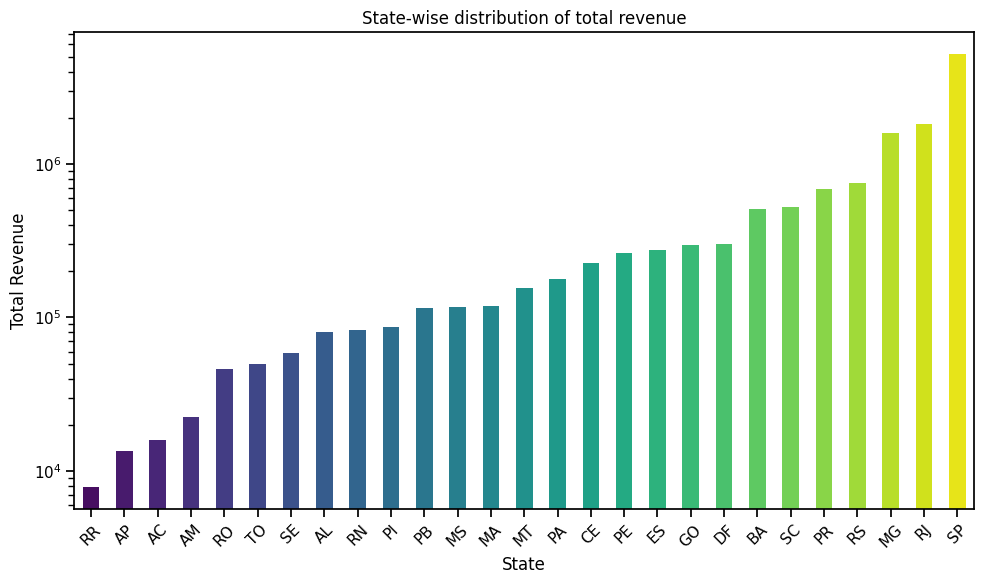

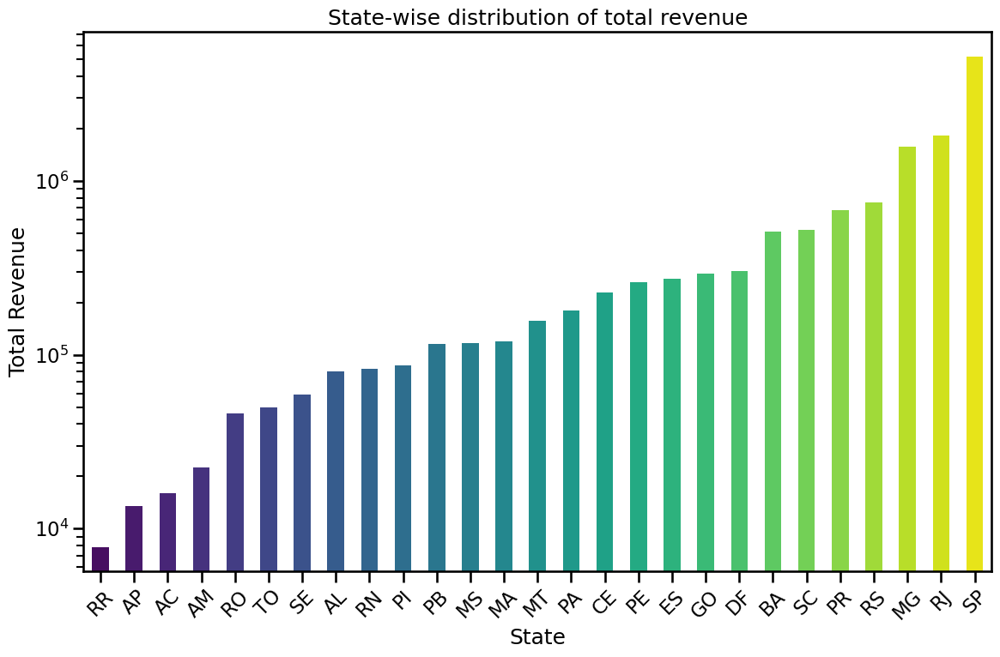

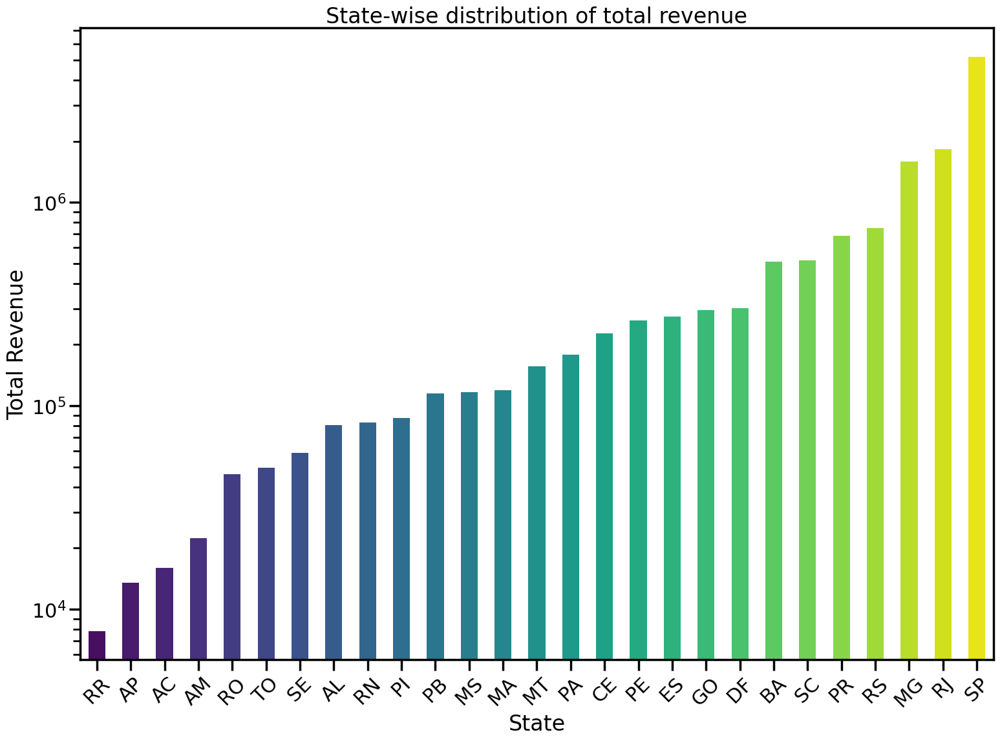

In [27]:
# Define color palette
continuous_palette = sns.color_palette("viridis", len(state_revenue))

# Plot for different contexts
for context, size in zip(contexts, sizes):
    sns.set_context(context)
    plt.figure(figsize=size)
    state_revenue.plot(kind='bar', color=continuous_palette)
    plt.title('State-wise distribution of total revenue')
    plt.xlabel('State')
    plt.ylabel('Total Revenue')
    plt.xticks(rotation=45)
    plt.yscale('log')
    plt.tight_layout()

plt.show()


##One Color Sequential Scale

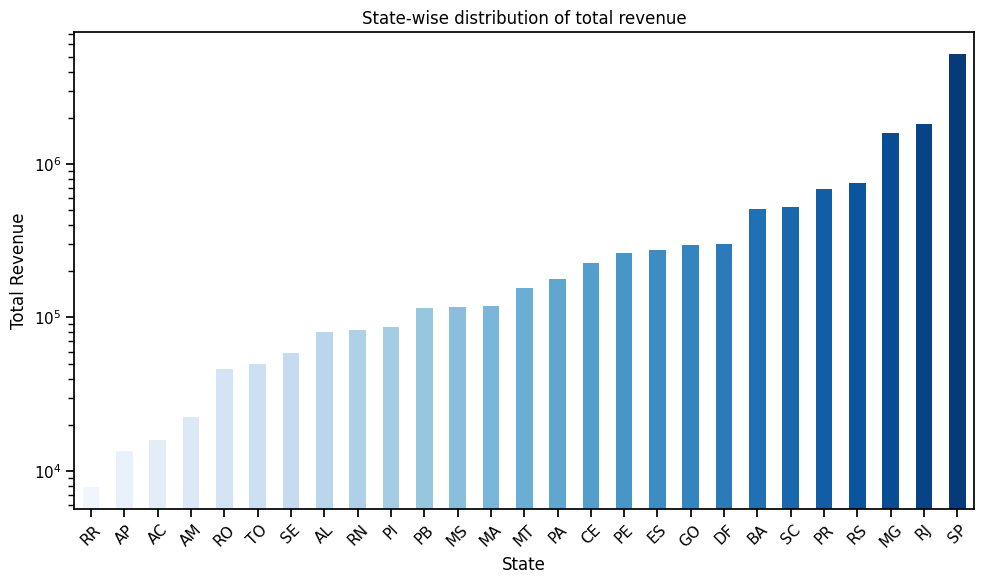

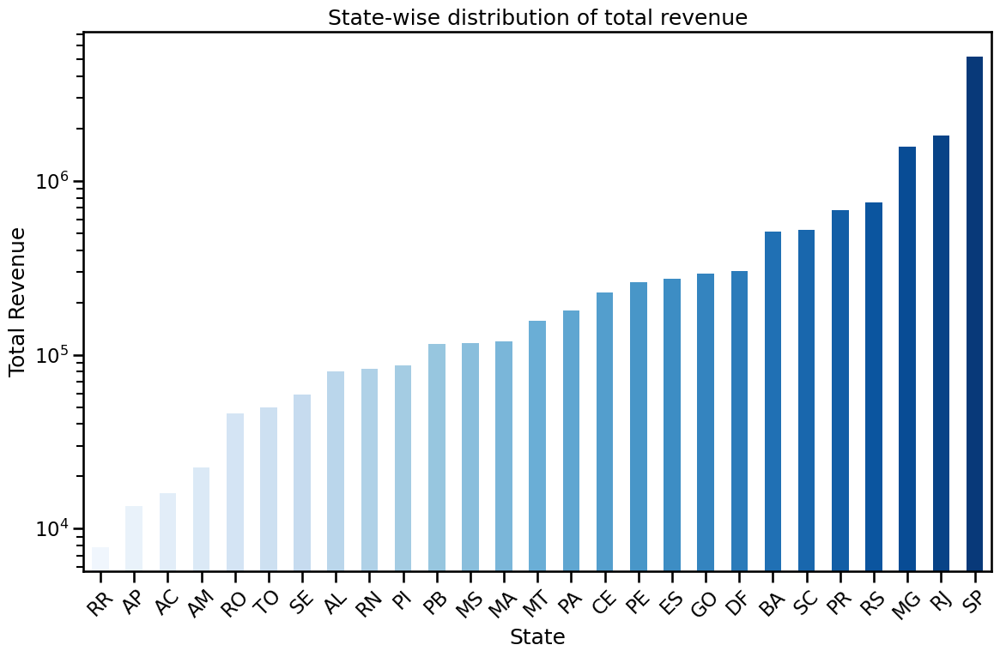

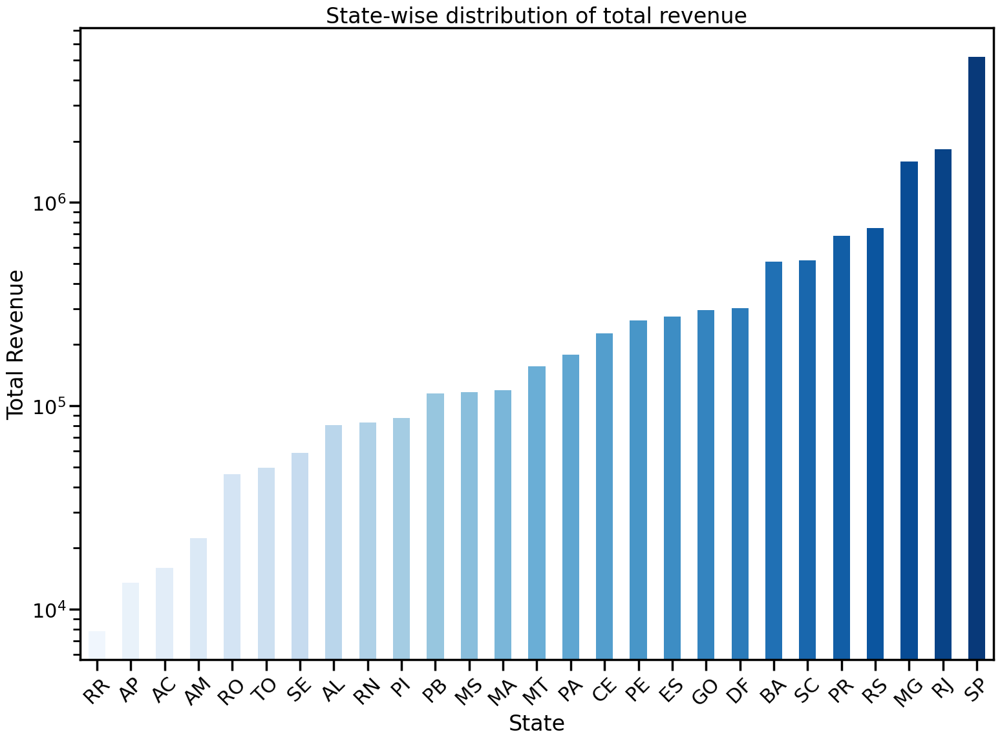

In [28]:
# Define color palette
sequential_palette = sns.color_palette("Blues", len(state_revenue))

for context, size in zip(contexts, sizes):
    sns.set_context(context)
    plt.figure(figsize=size)
    state_revenue.plot(kind='bar', color=sequential_palette)
    plt.title('State-wise distribution of total revenue')
    plt.xlabel('State')
    plt.ylabel('Total Revenue')
    plt.xticks(rotation=45)
    plt.yscale('log')
    plt.tight_layout()

plt.show()

##Bipolar Scale

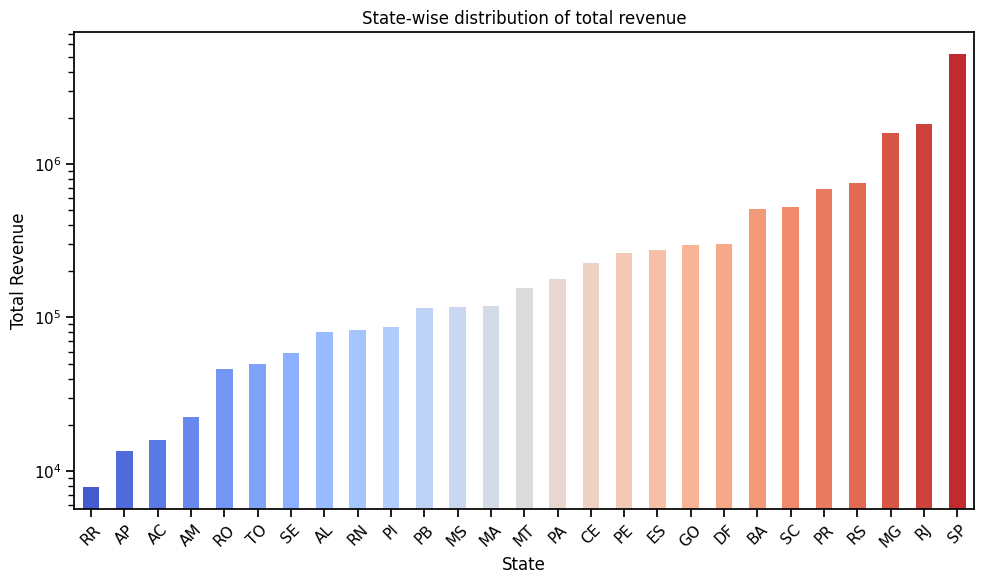

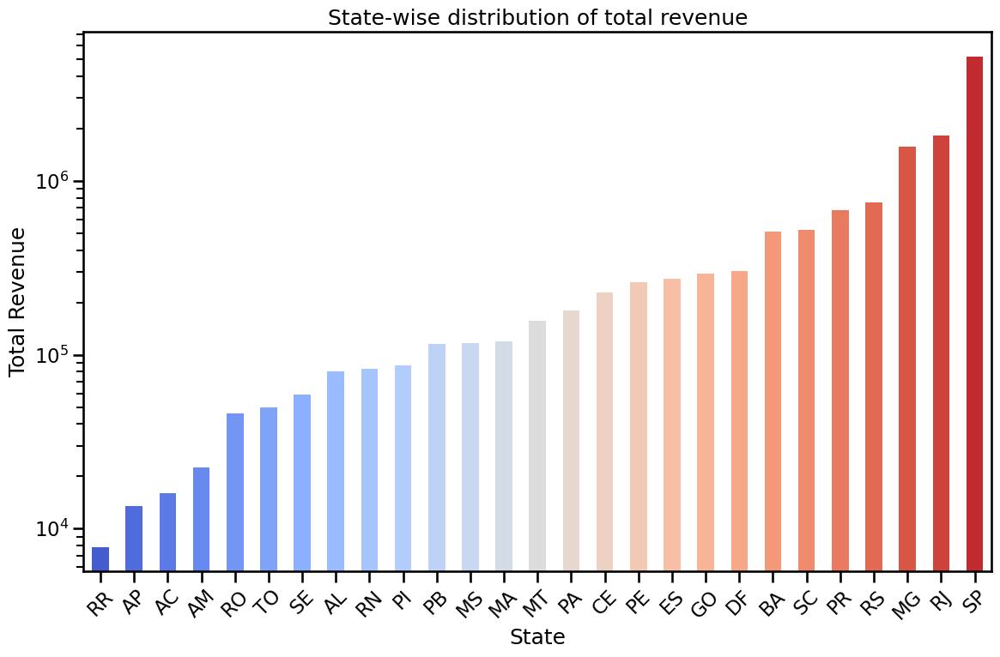

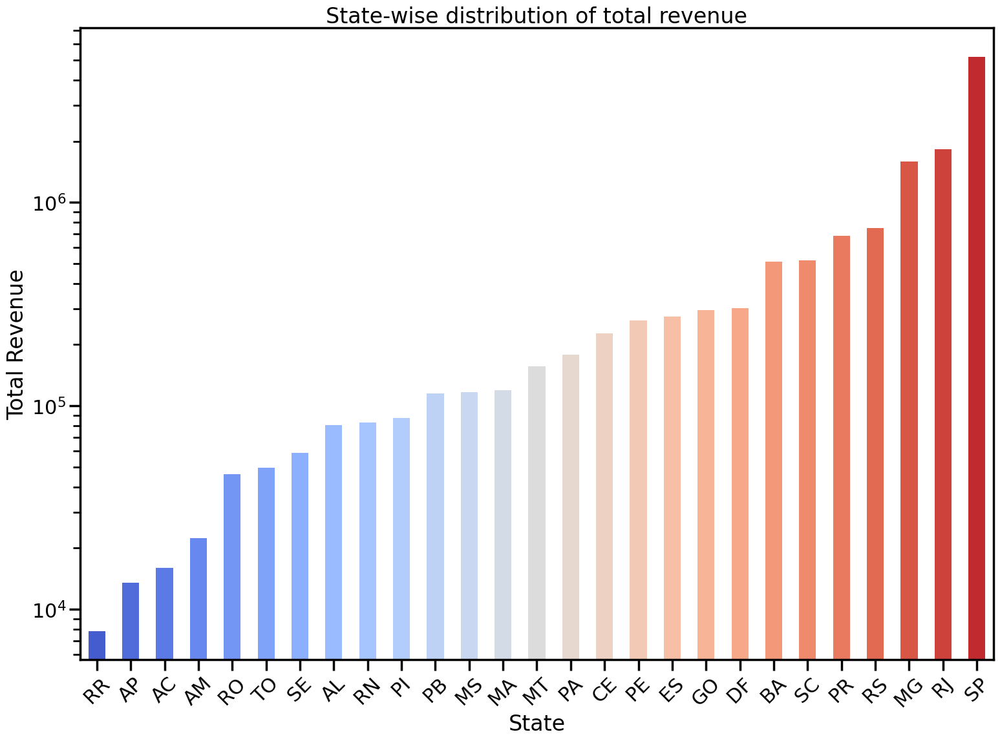

In [29]:
# Define color palette
bipolar_palette = sns.color_palette("coolwarm", len(state_revenue))

for context, size in zip(contexts, sizes):
    sns.set_context(context)
    plt.figure(figsize=size)
    state_revenue.plot(kind='bar', color=bipolar_palette)
    plt.title('State-wise distribution of total revenue')
    plt.xlabel('State')
    plt.ylabel('Total Revenue')
    plt.xticks(rotation=45)
    plt.yscale('log')
    plt.tight_layout()

plt.show()


##Custom Scale

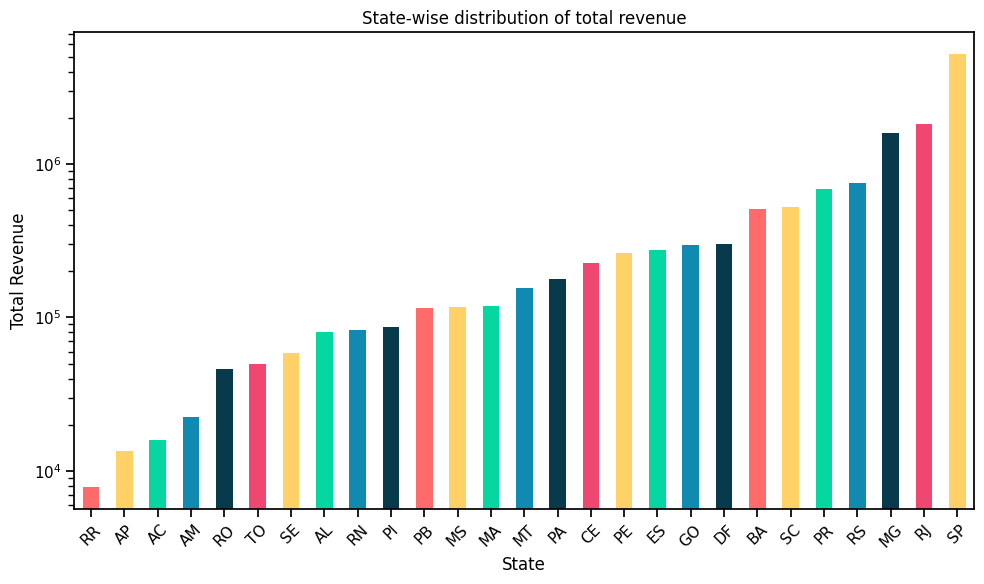

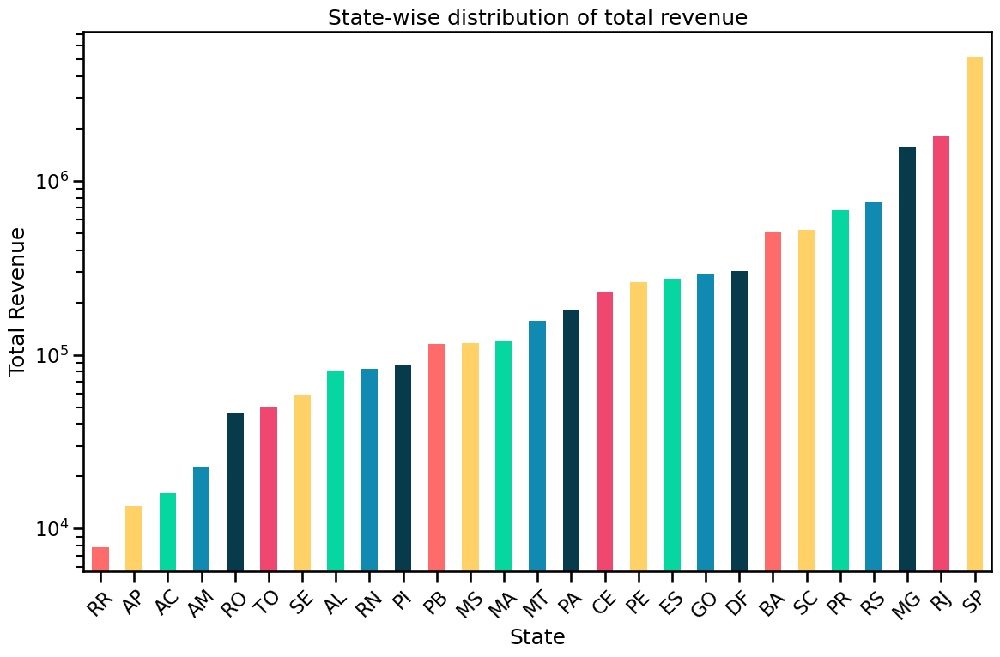

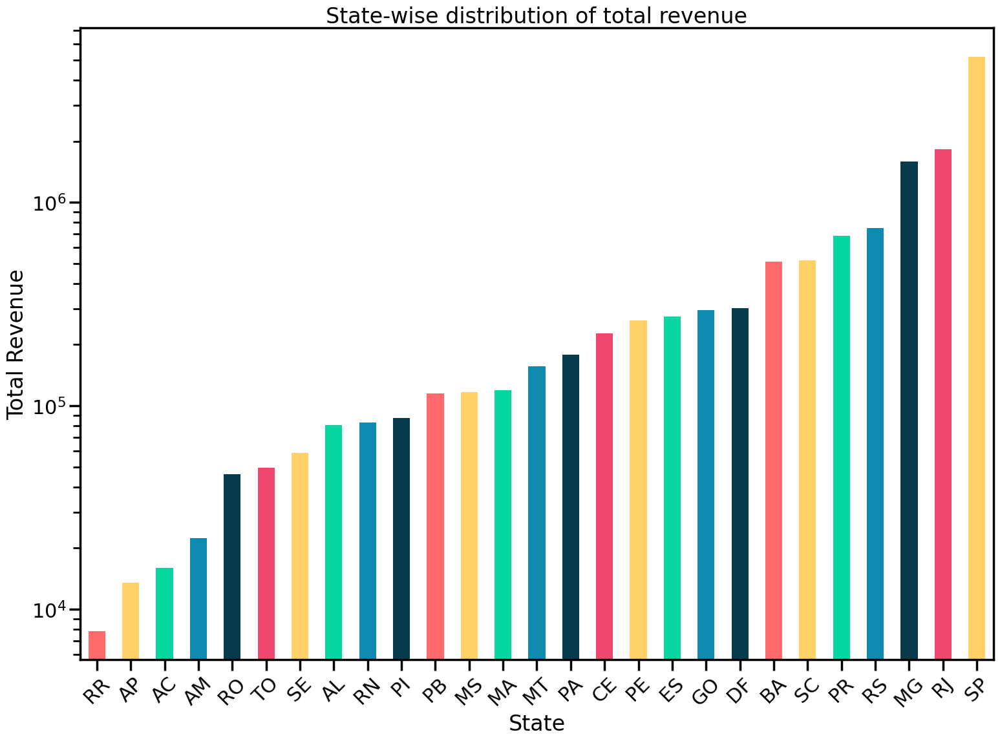

In [30]:
# Define color palette
custom_palette = ['#FF6B6B', '#FFD166', '#06D6A0', '#118AB2', '#073B4C', '#EF476F', '#FFD166', '#06D6A0', '#118AB2', '#073B4C']

for context, size in zip(contexts, sizes):
    sns.set_context(context)
    plt.figure(figsize=size)
    state_revenue.plot(kind='bar', color=custom_palette)
    plt.title('State-wise distribution of total revenue')
    plt.xlabel('State')
    plt.ylabel('Total Revenue')
    plt.xticks(rotation=45)
    plt.yscale('log')
    plt.tight_layout()

plt.show()


#Distribution of Customers, Sellers in Different Cities of each States

In [31]:
# Calculate the number of unique cities for customers and sellers in each state
state_city_customers = customer_df.groupby('customer_state')['customer_city'].nunique().sort_values()
state_city_sellers = seller_df.groupby('seller_state')['seller_city'].nunique().sort_values()

##Plotting Pie Chart to show the distribution of each seller and customer in each state

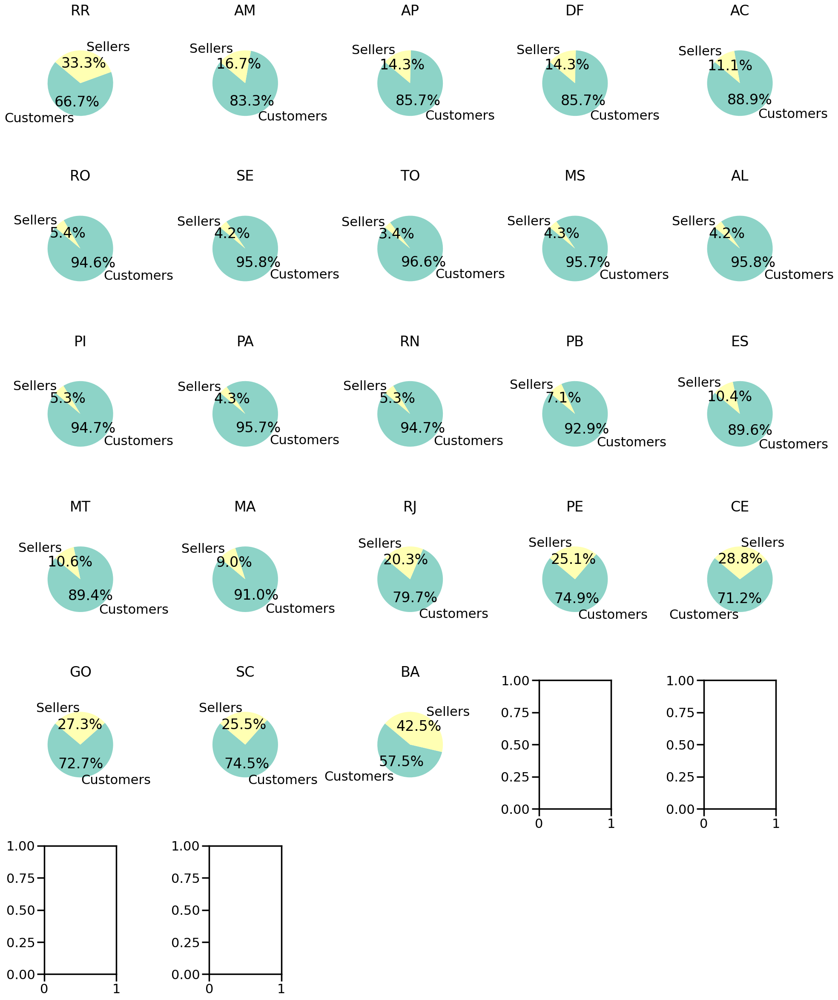

In [32]:
# Define color palette
color_palette = sns.color_palette("Set3")

# Calculate the number of states
num_states = len(state_city_customers)

num_cols = min(num_states, 5)
num_rows = (num_states - 1) // num_cols + 1

# Plot for each state
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 4 * num_rows))

for i, (state, (num_customers, num_sellers)) in enumerate(zip(state_city_customers.index, zip(state_city_customers, state_city_sellers))):
    row = i // num_cols
    col = i % num_cols

    sizes = [num_customers, num_sellers]
    labels = ['Customers', 'Sellers']
    colors = color_palette[:2]

    axes[row, col].pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140)
    axes[row, col].set_title(f'{state}')
    axes[row, col].axis('equal')

# Remove any empty subplots
if num_states < num_rows * num_cols:
    for i in range(num_states, num_rows * num_cols):
        fig.delaxes(axes.flatten()[i])

plt.tight_layout()
plt.show()


#Plotting Horizontally side by side as subplot, But a little confusing

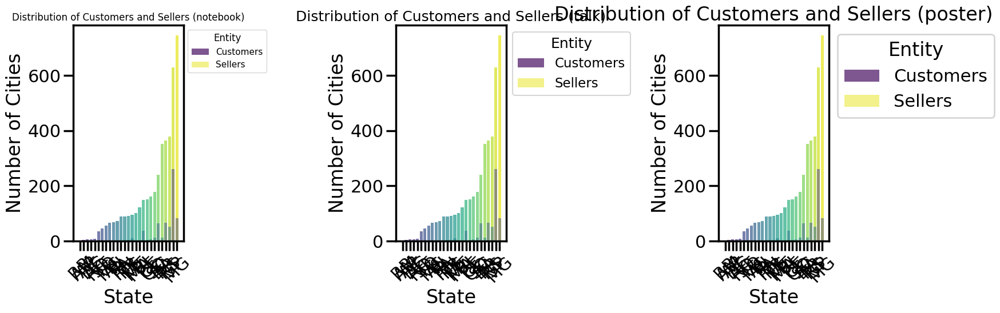

In [39]:
# Define color palette
continuous_palette = sns.color_palette("viridis", max(len(state_city_customers), len(state_city_sellers)))

# Plot for different contexts
fig, axes = plt.subplots(1, len(contexts), figsize=(18, 6))

for i, (context, size) in enumerate(zip(contexts, sizes)):
    sns.set_context(context)
    axes[i].bar(state_city_customers.index, state_city_customers.values, color=continuous_palette, alpha=0.7, label='Customers')
    axes[i].bar(state_city_sellers.index, state_city_sellers.values, color=continuous_palette[::-1], alpha=0.5, label='Sellers')
    axes[i].set_title(f'Distribution of Customers and Sellers ({context})')
    axes[i].set_xlabel('State')
    axes[i].set_ylabel('Number of Cities')
    axes[i].legend(title='Entity', bbox_to_anchor=(1, 1), loc='upper left')
    axes[i].tick_params(axis='x', rotation=45)

fig.tight_layout()
plt.show()


#Plotting vertically one after other (all the three representations)

##Continuous Scale

In [34]:
# Define context settings
contexts = ["notebook", "talk", "poster"]
sizes = [(10, 6), (12, 8), (16, 12)]

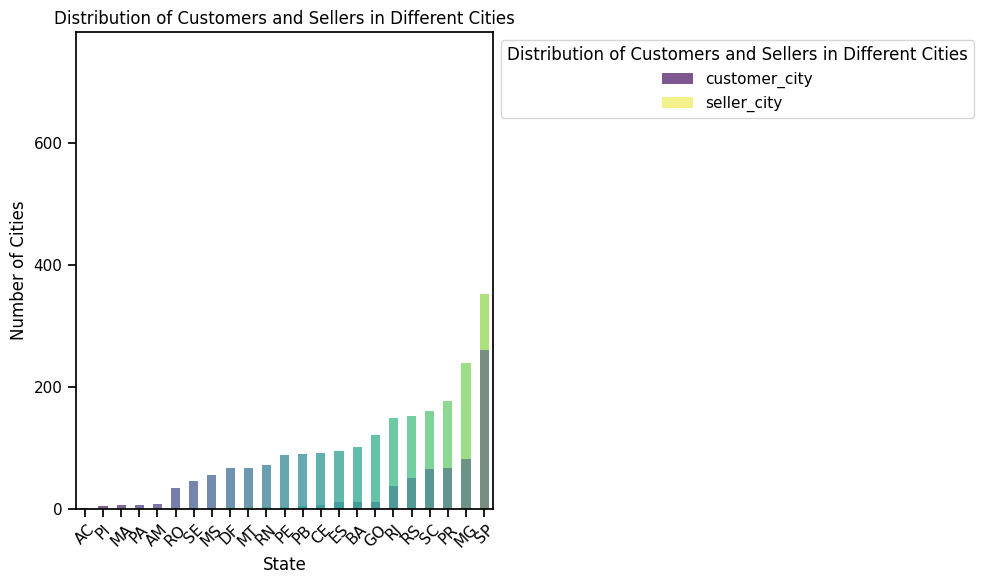

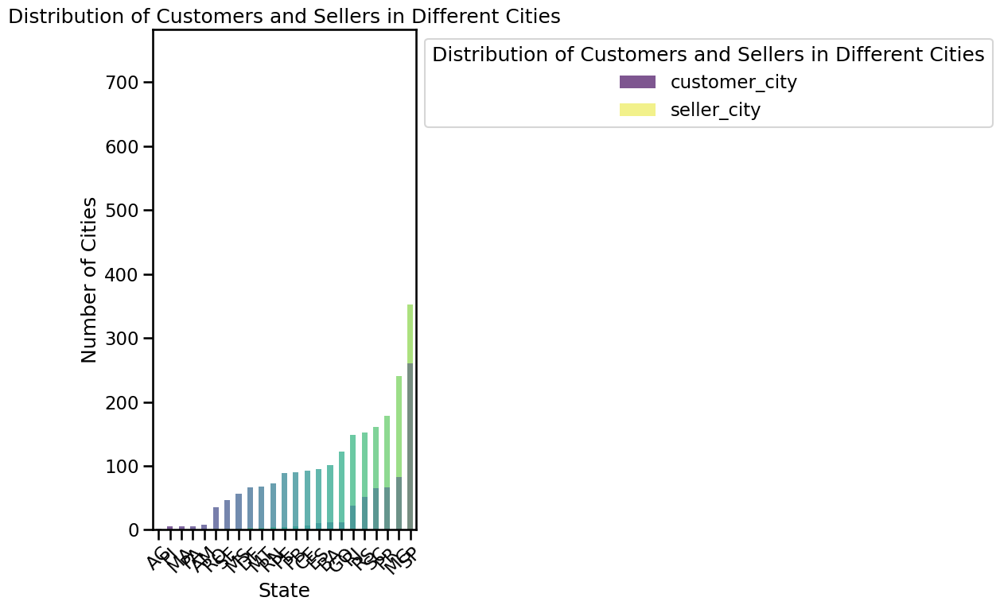

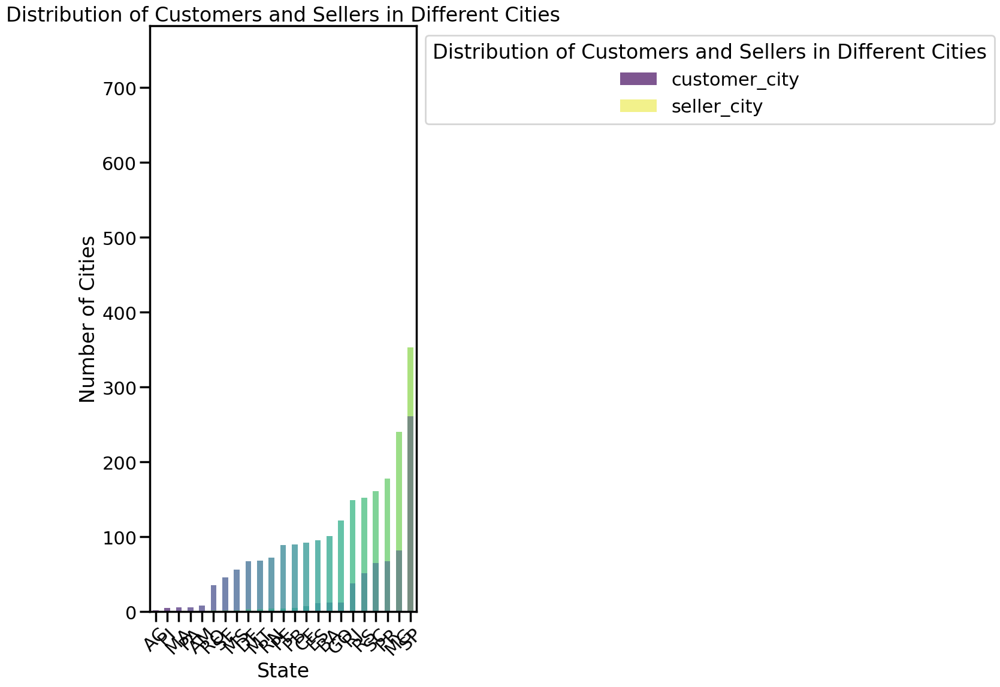

In [35]:
# Define color palette
continuous_palette = sns.color_palette("viridis", max(len(state_city_customers), len(state_city_sellers)))

# Plot for different contexts
for context, size in zip(contexts, sizes):
    sns.set_context(context)
    plt.figure(figsize=size)
    state_city_customers.plot(kind='bar', color=continuous_palette, alpha=0.7)
    state_city_sellers.plot(kind='bar', color=continuous_palette[::-1], alpha=0.5)
    plt.title('Distribution of Customers and Sellers in Different Cities')
    plt.xlabel('State')
    plt.ylabel('Number of Cities')
    plt.xticks(rotation=45)
    plt.legend(title='Distribution of Customers and Sellers in Different Cities', bbox_to_anchor=(1, 1), loc='upper left')
    plt.tight_layout()

plt.show()


##One Color Sequential Scale

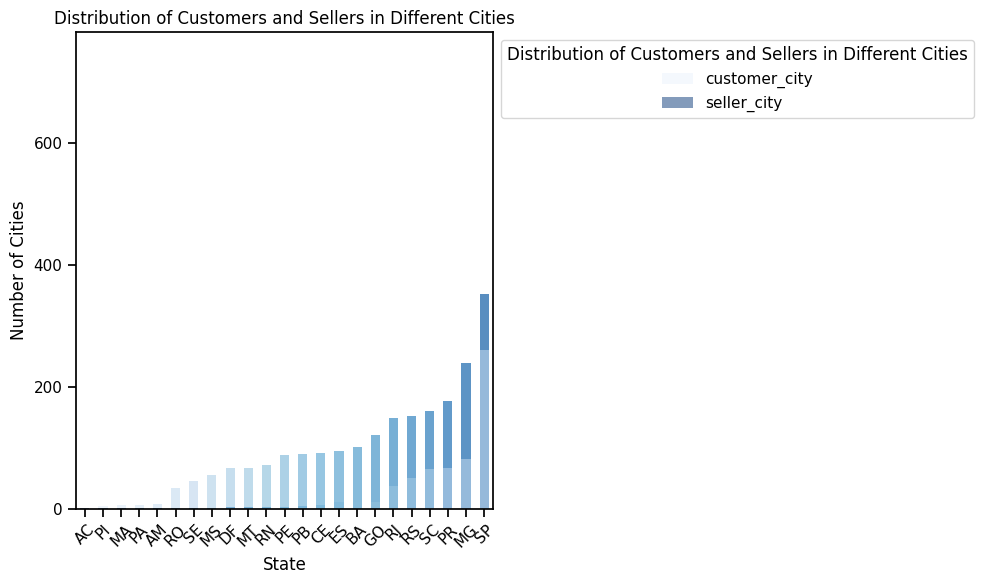

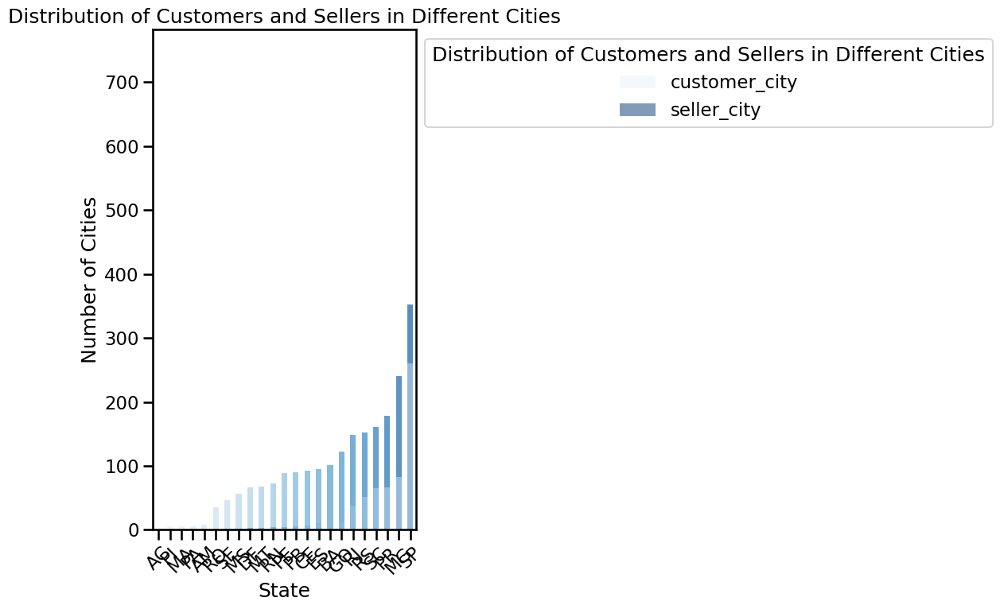

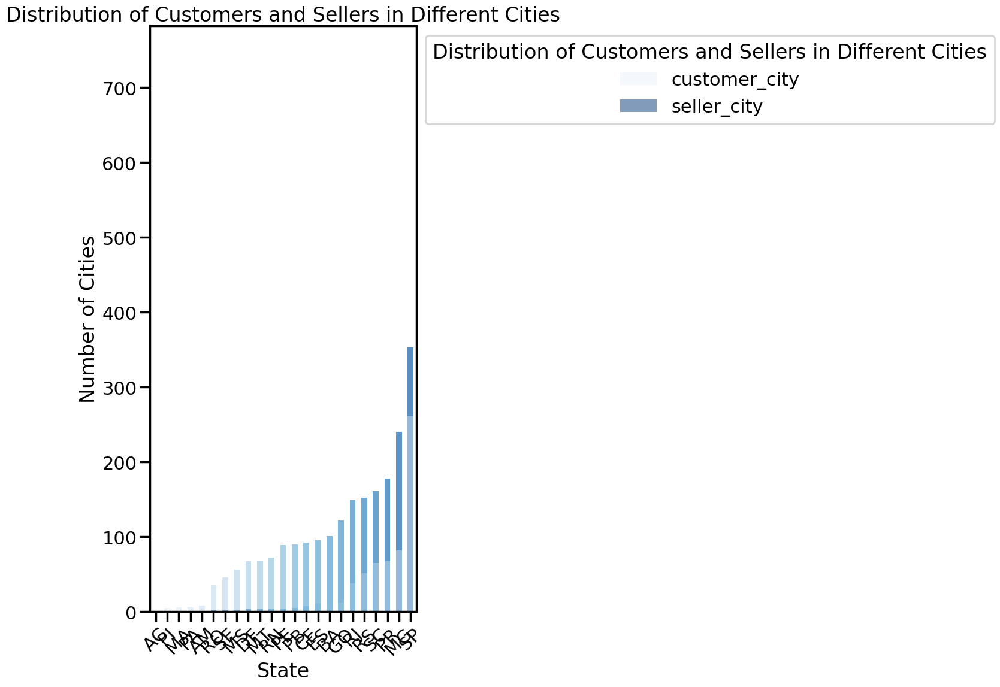

In [36]:
# Define color palette
sequential_palette = sns.color_palette("Blues", max(len(state_city_customers), len(state_city_sellers)))

# Plot for different contexts
for context, size in zip(contexts, sizes):
    sns.set_context(context)
    plt.figure(figsize=size)
    state_city_customers.plot(kind='bar', color=sequential_palette, alpha=0.7)
    state_city_sellers.plot(kind='bar', color=sequential_palette[::-1], alpha=0.5)
    plt.title('Distribution of Customers and Sellers in Different Cities')
    plt.xlabel('State')
    plt.ylabel('Number of Cities')
    plt.xticks(rotation=45)
    plt.legend(title='Distribution of Customers and Sellers in Different Cities', bbox_to_anchor=(1, 1), loc='upper left')
    plt.tight_layout()

plt.show()


##Bipolar Scale

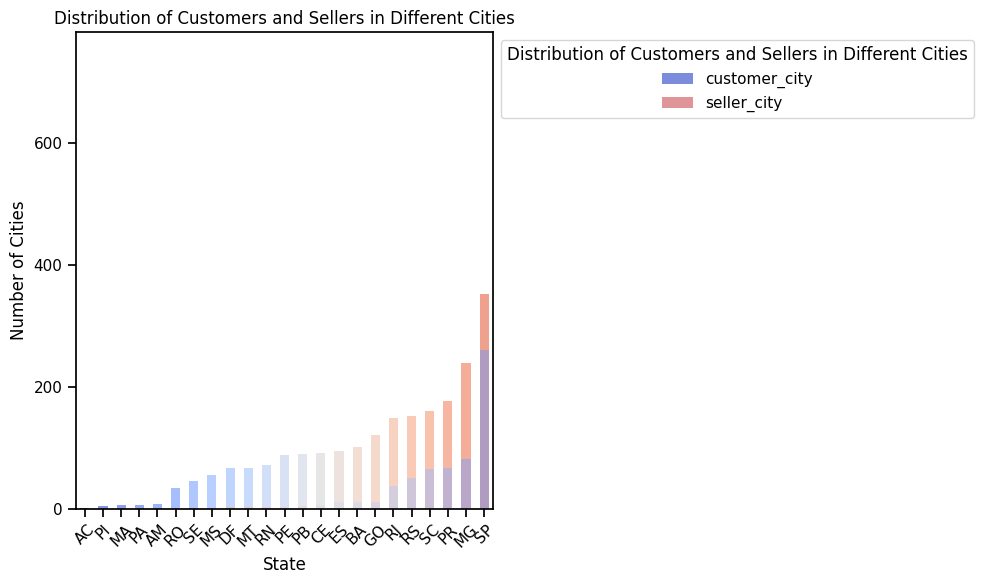

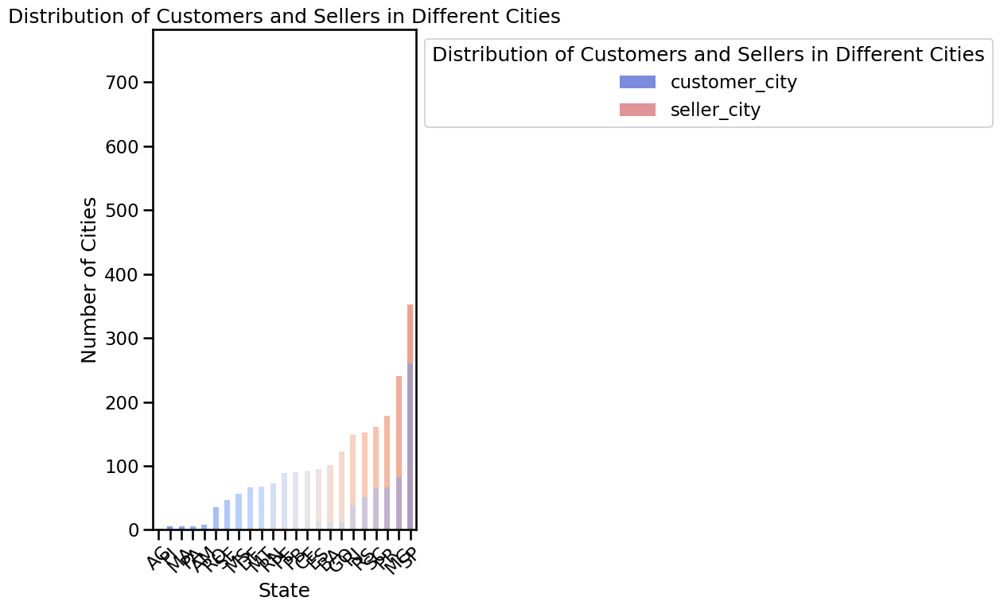

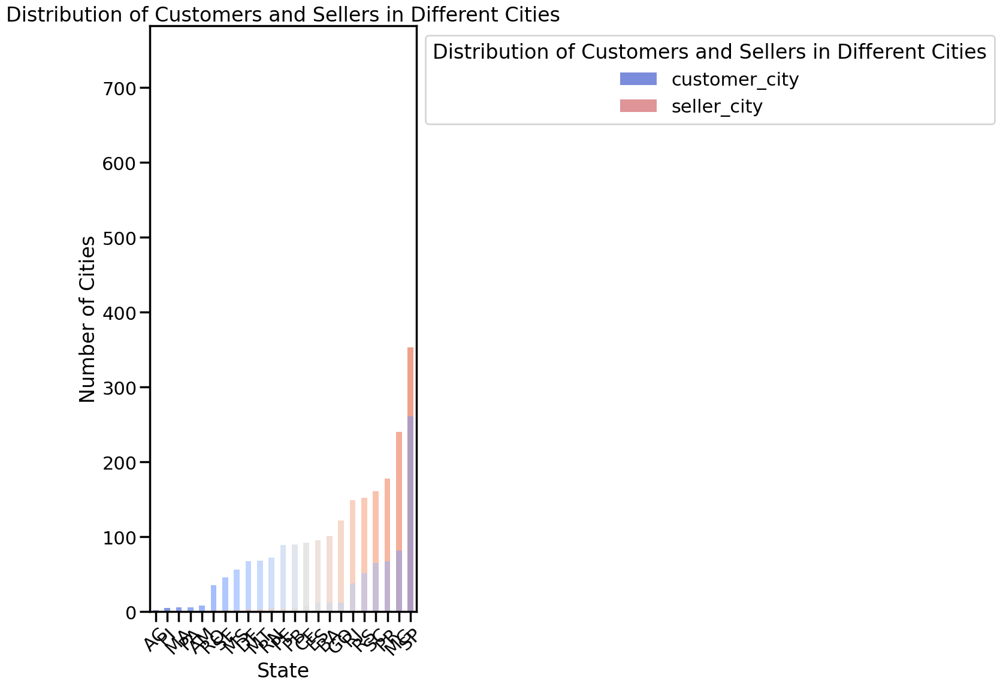

In [37]:
# Define color palette
bipolar_palette = sns.color_palette("coolwarm", max(len(state_city_customers), len(state_city_sellers)))

# Plot for different contexts
for context, size in zip(contexts, sizes):
    sns.set_context(context)
    plt.figure(figsize=size)
    state_city_customers.plot(kind='bar', color=bipolar_palette, alpha=0.7)
    state_city_sellers.plot(kind='bar', color=bipolar_palette[::-1], alpha=0.5)
    plt.title('Distribution of Customers and Sellers in Different Cities')
    plt.xlabel('State')
    plt.ylabel('Number of Cities')
    plt.xticks(rotation=45)
    plt.legend(title='Distribution of Customers and Sellers in Different Cities', bbox_to_anchor=(1, 1), loc='upper left')
    plt.tight_layout()

plt.show()


##Custom Scale

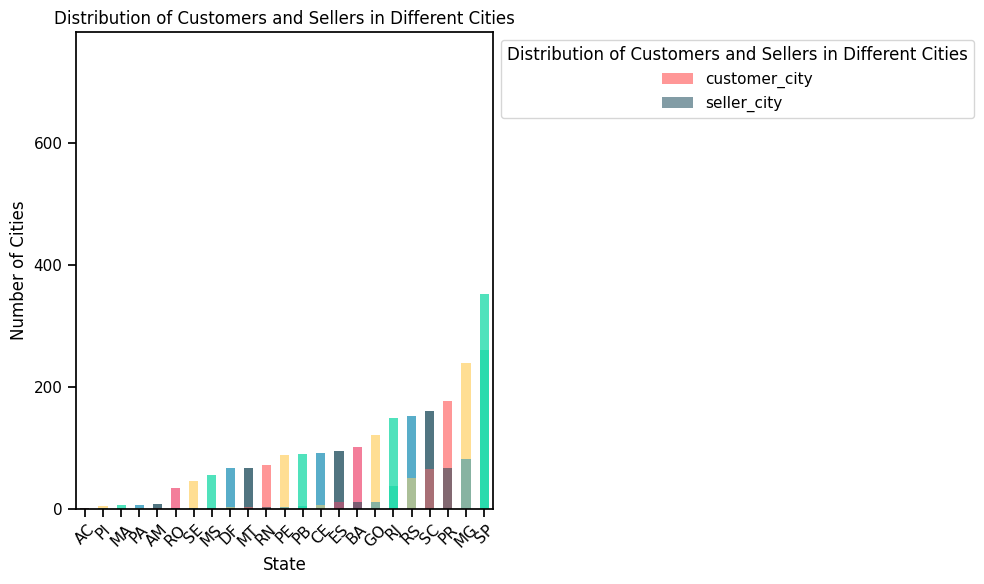

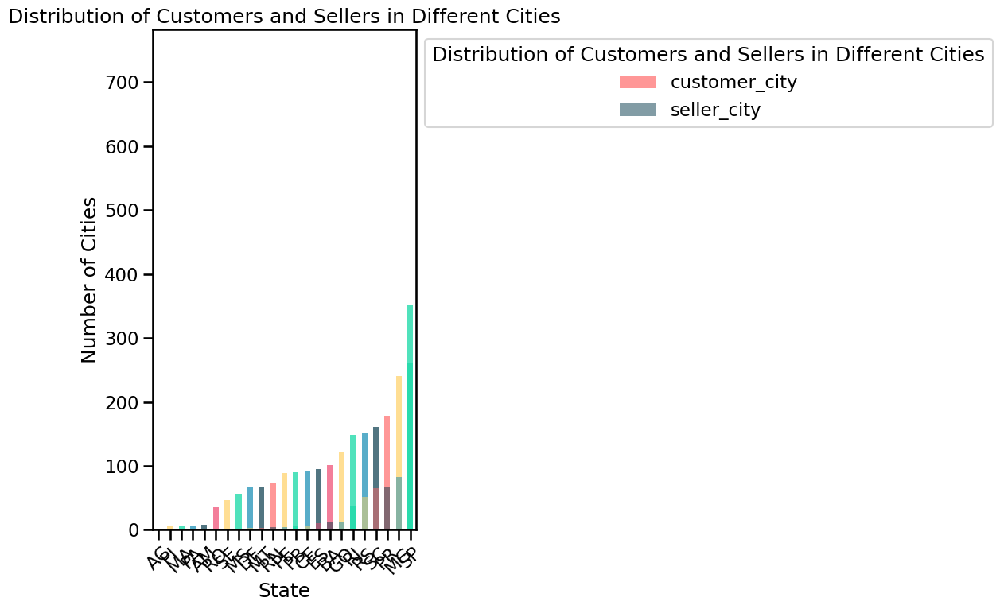

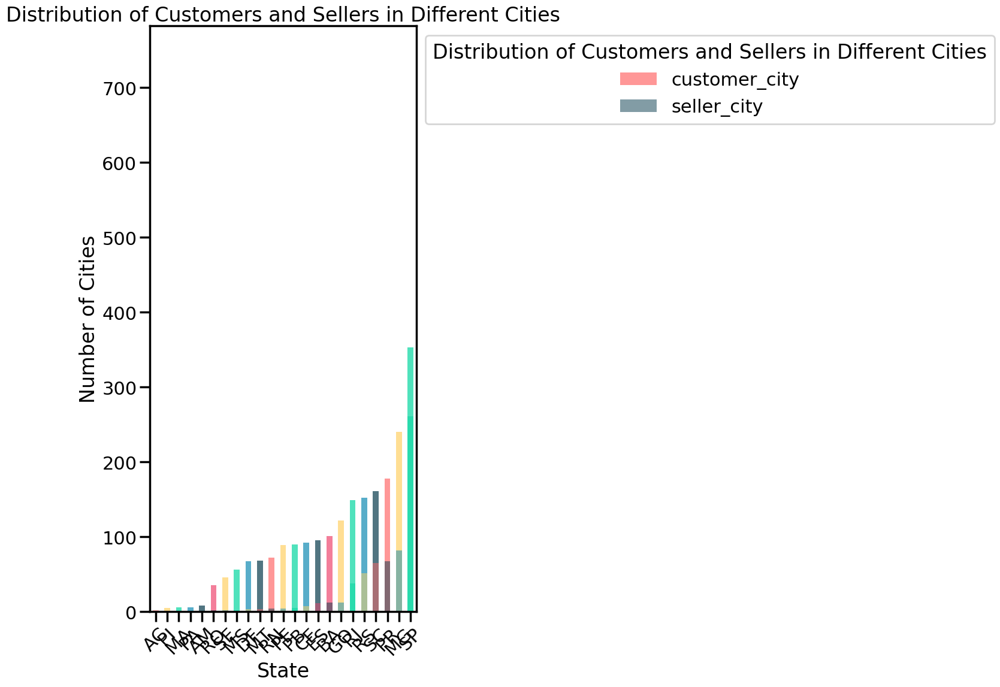

In [38]:
# Define color palette
custom_palette = ['#FF6B6B', '#FFD166', '#06D6A0', '#118AB2', '#073B4C', '#EF476F', '#FFD166', '#06D6A0', '#118AB2', '#073B4C']

# Plot for different contexts
for context, size in zip(contexts, sizes):
    sns.set_context(context)
    plt.figure(figsize=size)
    state_city_customers.plot(kind='bar', color=custom_palette, alpha=0.7)
    state_city_sellers.plot(kind='bar', color=custom_palette[::-1], alpha=0.5)
    plt.title('Distribution of Customers and Sellers in Different Cities')
    plt.xlabel('State')
    plt.ylabel('Number of Cities')
    plt.xticks(rotation=45)
    plt.legend(title='Distribution of Customers and Sellers in Different Cities', bbox_to_anchor=(1, 1), loc='upper left')
    plt.tight_layout()

plt.show()
